In [1]:
import sys
sys.path.append('../')

In [2]:
import functions
import scipy
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter
from hosd_python.hosd import apply_hosd # library that I converted from MATLAB

In [3]:
no_ica_chans = 18
fs=1000
span = 10*fs
offset = 100*fs 
ms2s = lambda x, _:f'{x/1000:g}' 

In [4]:

data = functions.array_from_TDMSgroup("patients/P044/P044_S01_D2024-04-18_G36.tdms", "R001")
window_size=int(1400) # used for higher-order-spectral filtering
time_axis=np.linspace(0,int(window_size)-1,num=int(window_size))

In [5]:
data_hos = np.zeros_like(data)
for channel in range(data.shape[1]):
    beat, detect = apply_hosd(data[:,channel], window_size) 
    data_hos[:,channel] = detect

### The output shows that only odd indeces have meaningful data, with exception 10, thus, let's only use those channels for ICA and observe the results

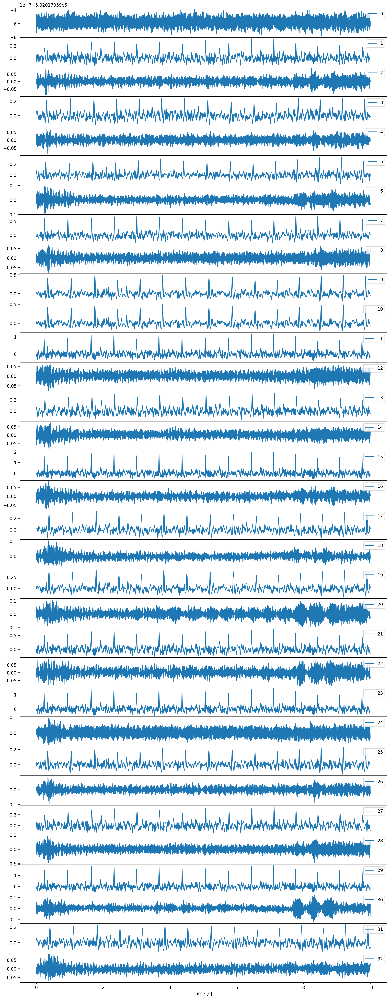

In [6]:
fig, ax = plt.subplots(data.shape[1], 1, sharex=True, figsize=(15, 40), dpi=250) #
fig.subplots_adjust(hspace=0)
    
for j in range(data.shape[1]):
    ax[j].plot(data_hos[offset:(offset + span), j], label=str(j))
    ax[j].legend(loc=1)
ax[-1].xaxis.set_major_formatter(ms2s)
ax[-1].set_xlabel('Time [s]')
plt.show()

### But before applying ICA, we know the importance of butter filter for ICA from butter_trials notebook, thus we first apply butter filter then ICA

In [9]:
data_filtered = functions.butter_filter(data)

### Let's try different number of ICA components, to see the results since we don't need 16 anymore because we only have 15 channels. Start with 2

### According to the results below, taking a small subset of sensors did not produce a fetal component, I analyzed them for 3 seconds below for different configurations of ICA channels

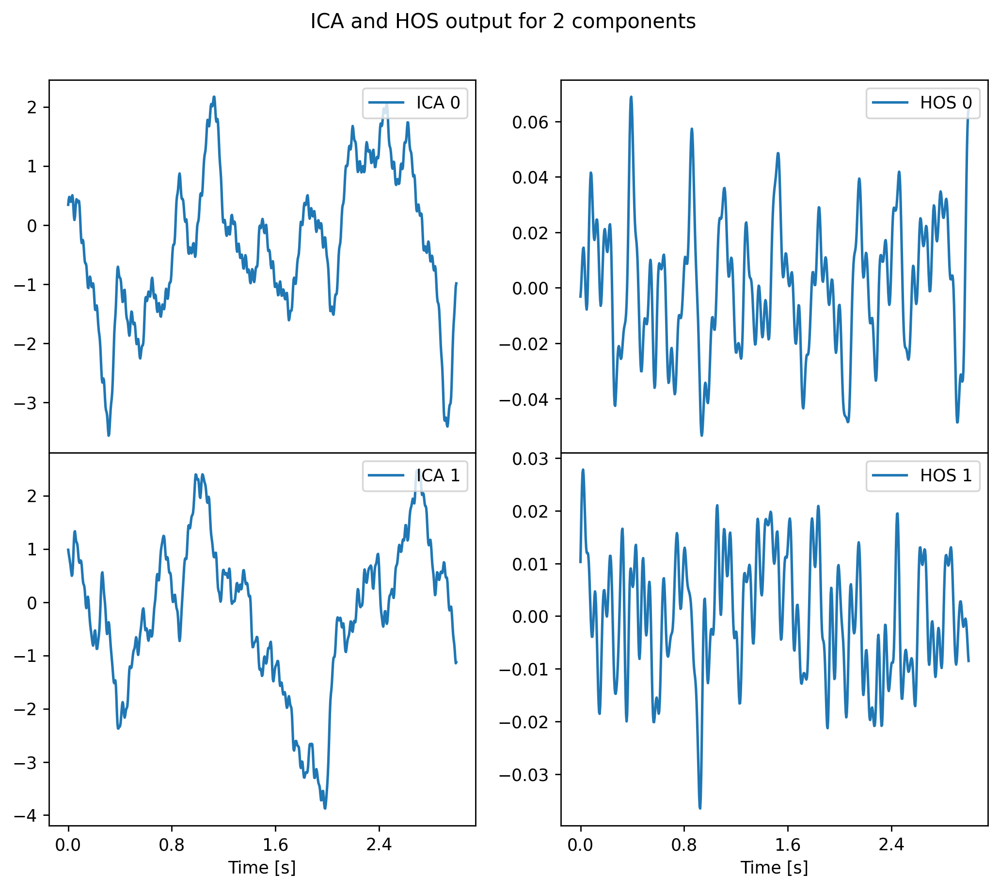

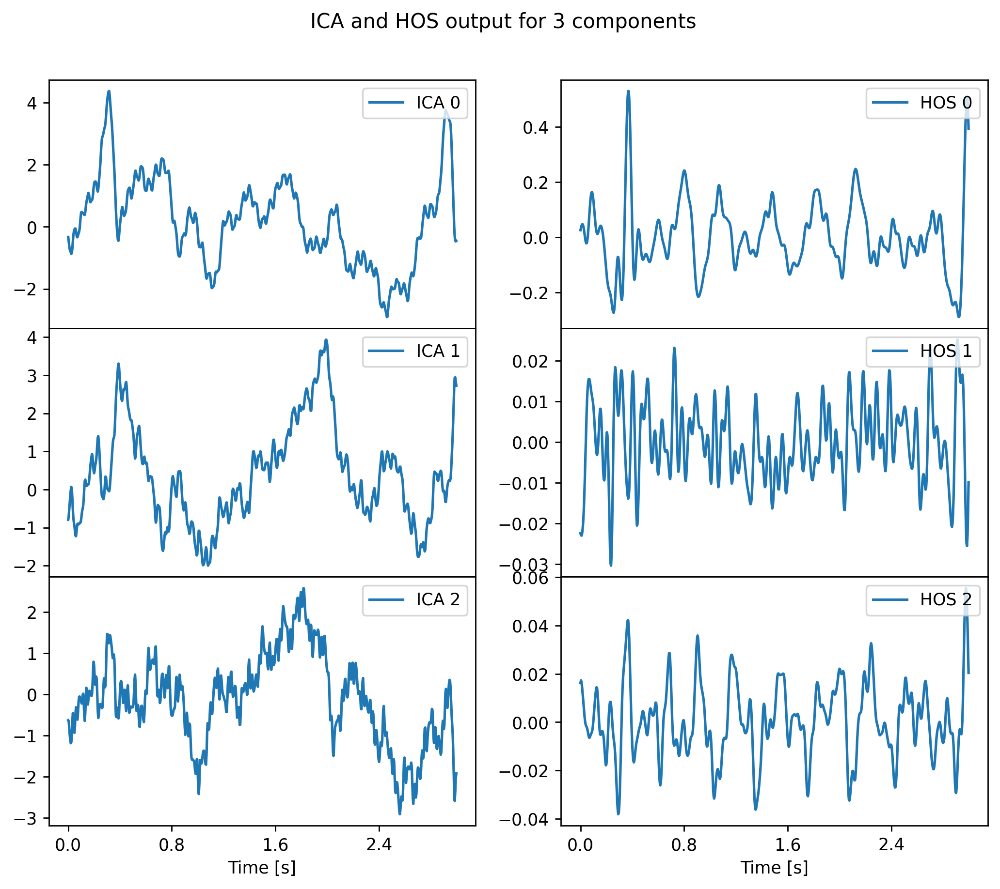

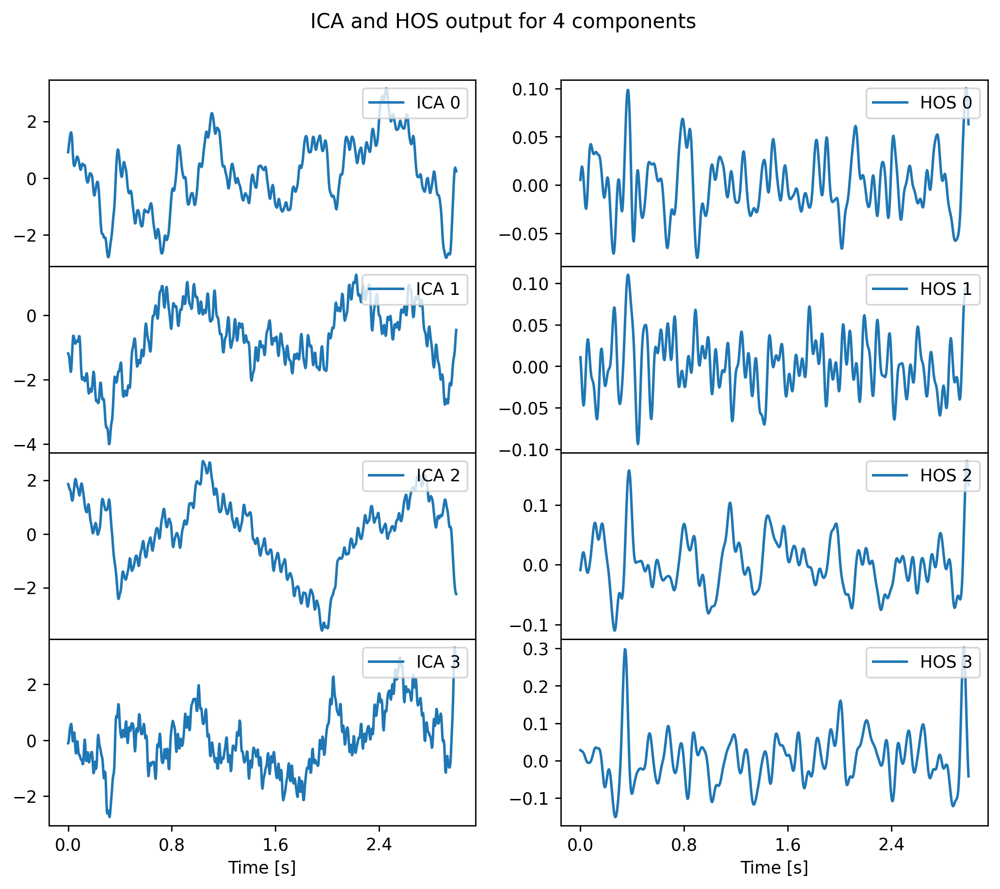

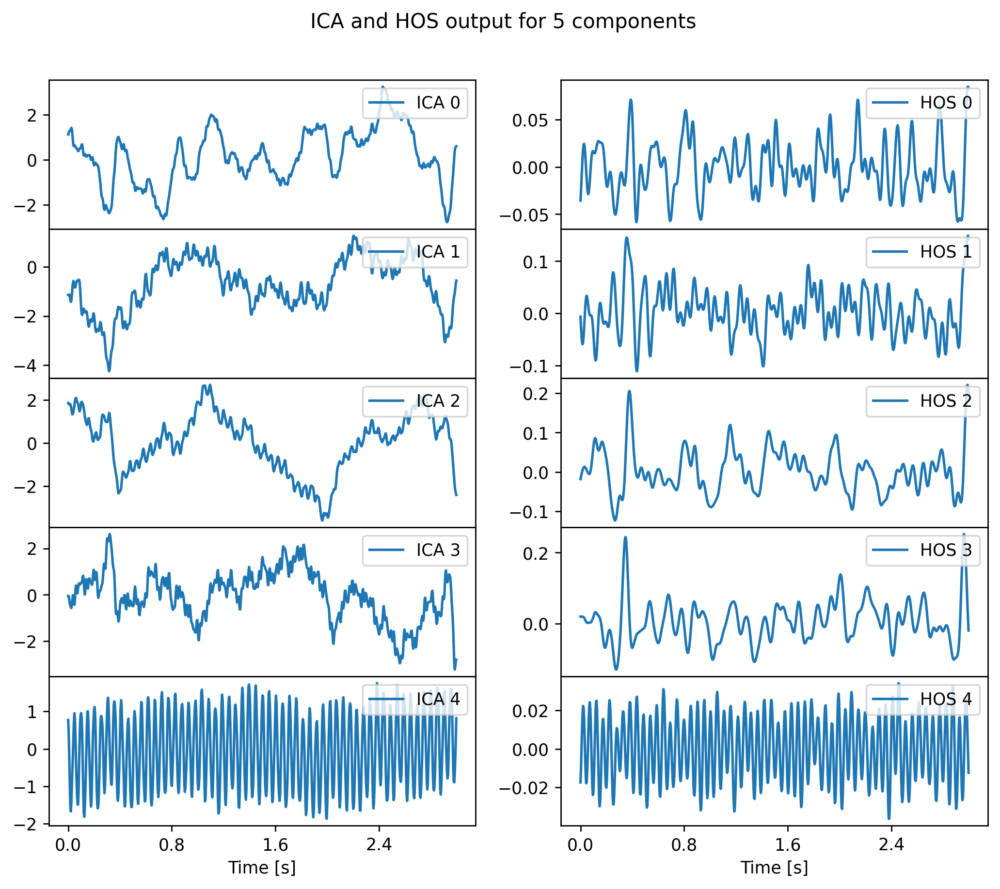

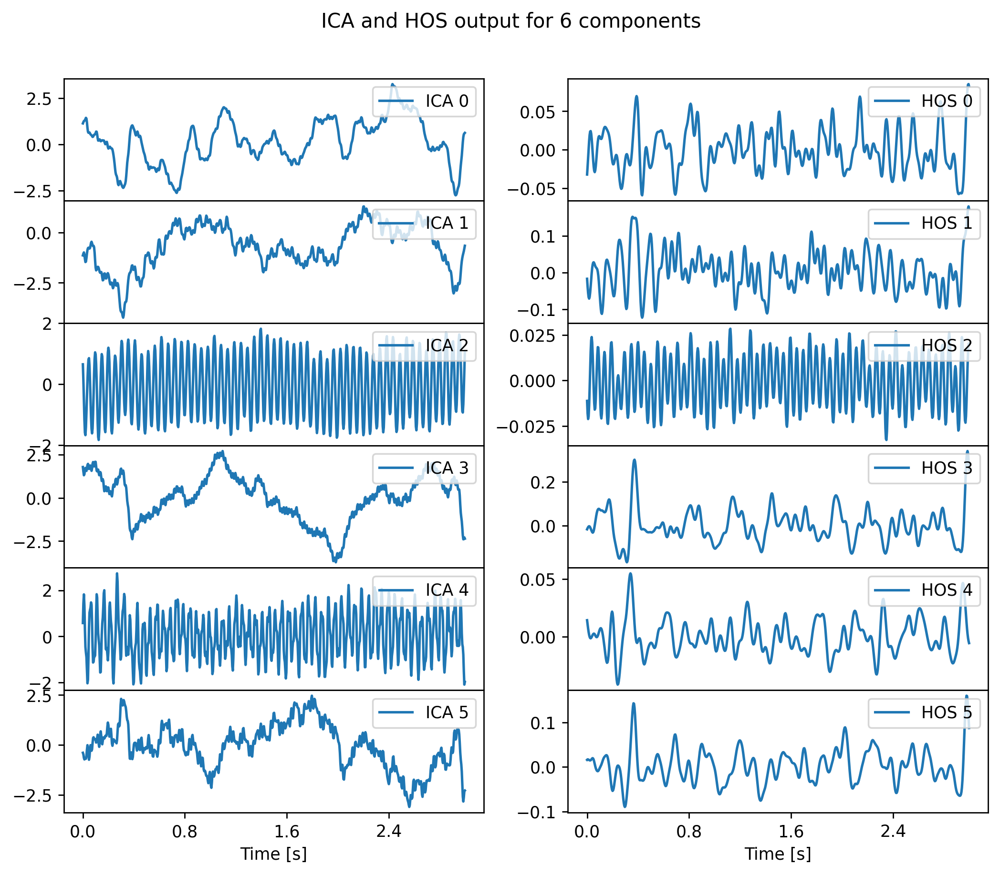

...

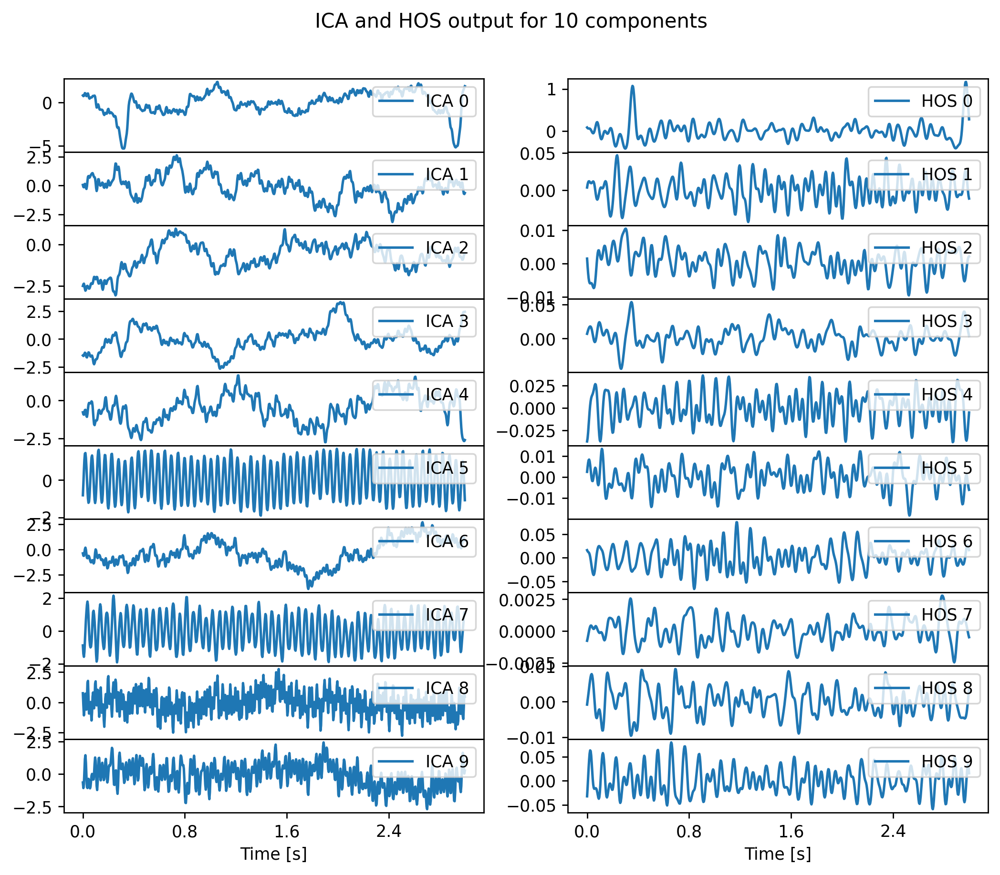

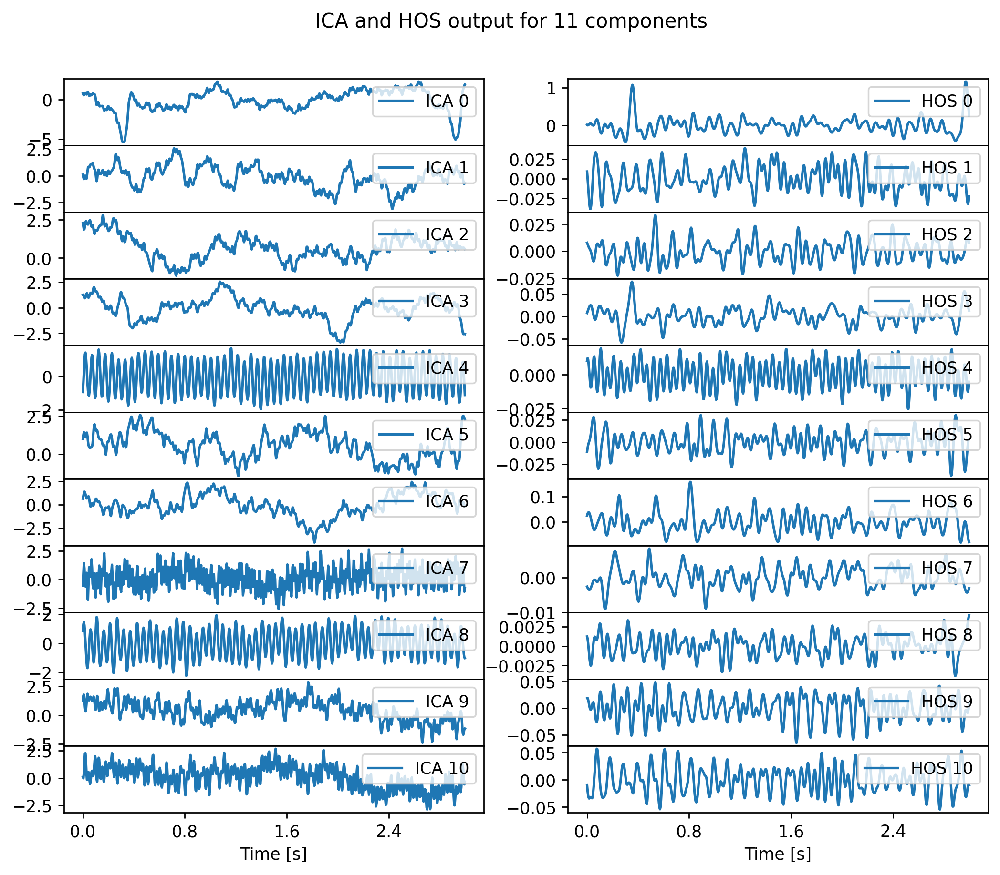

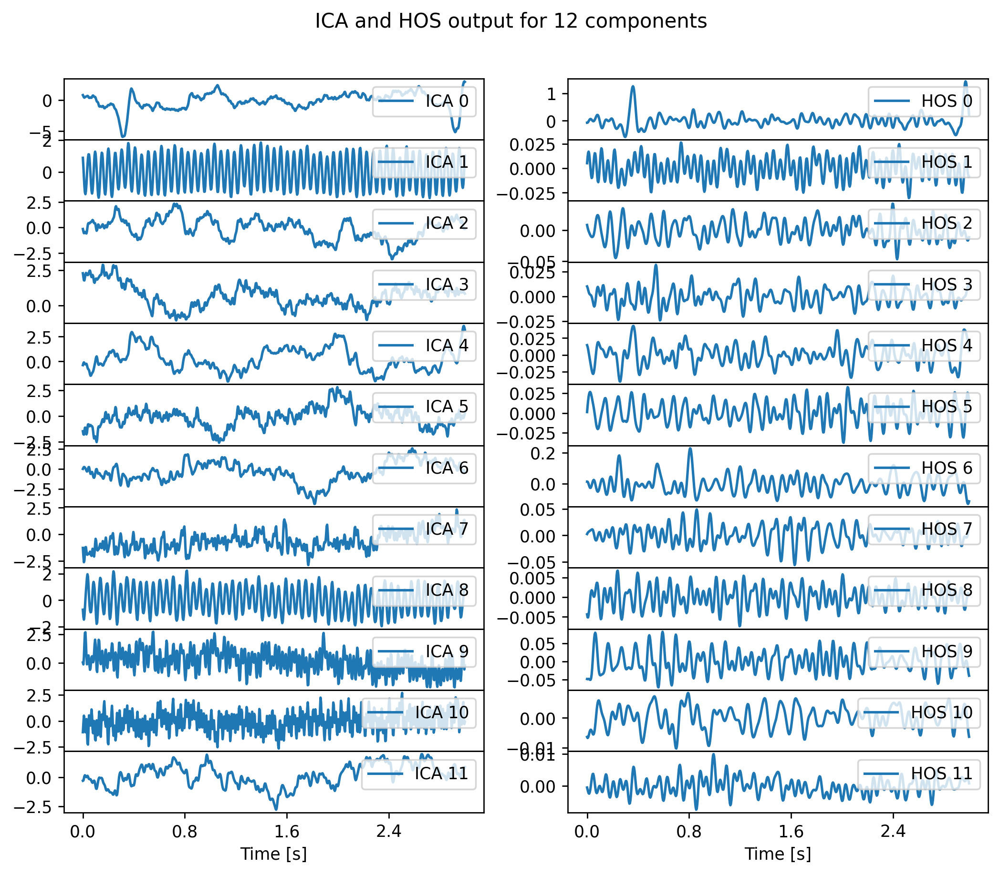

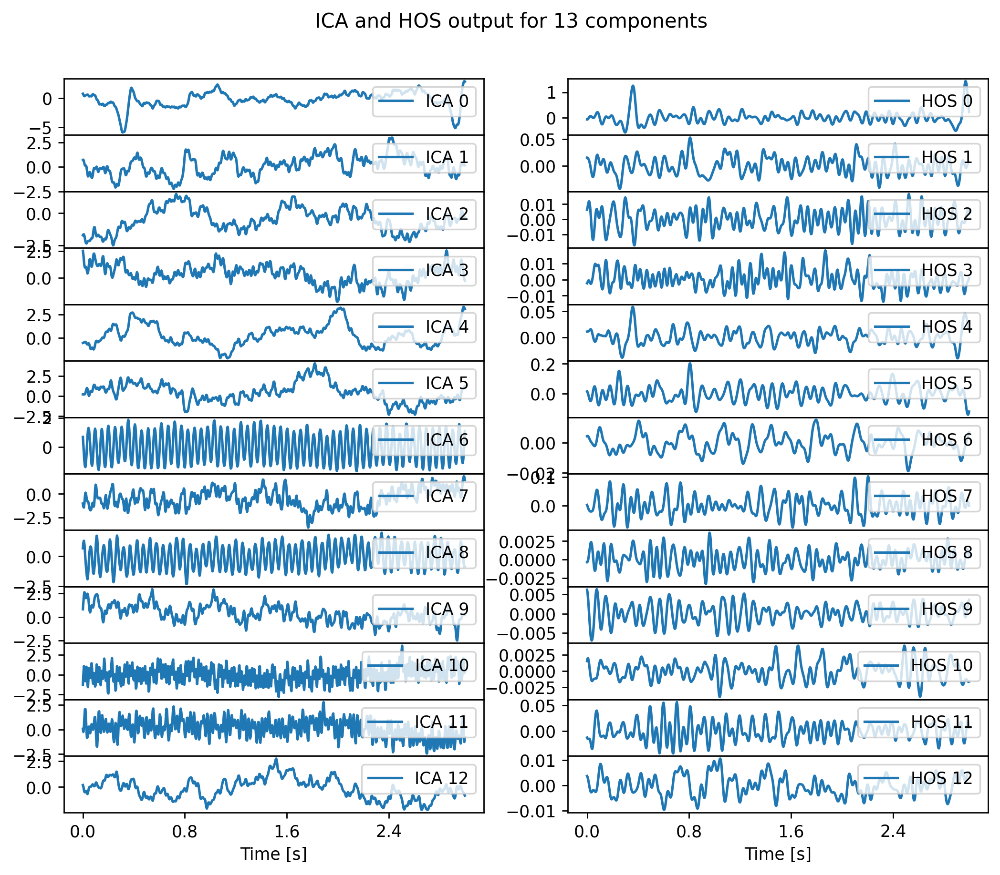

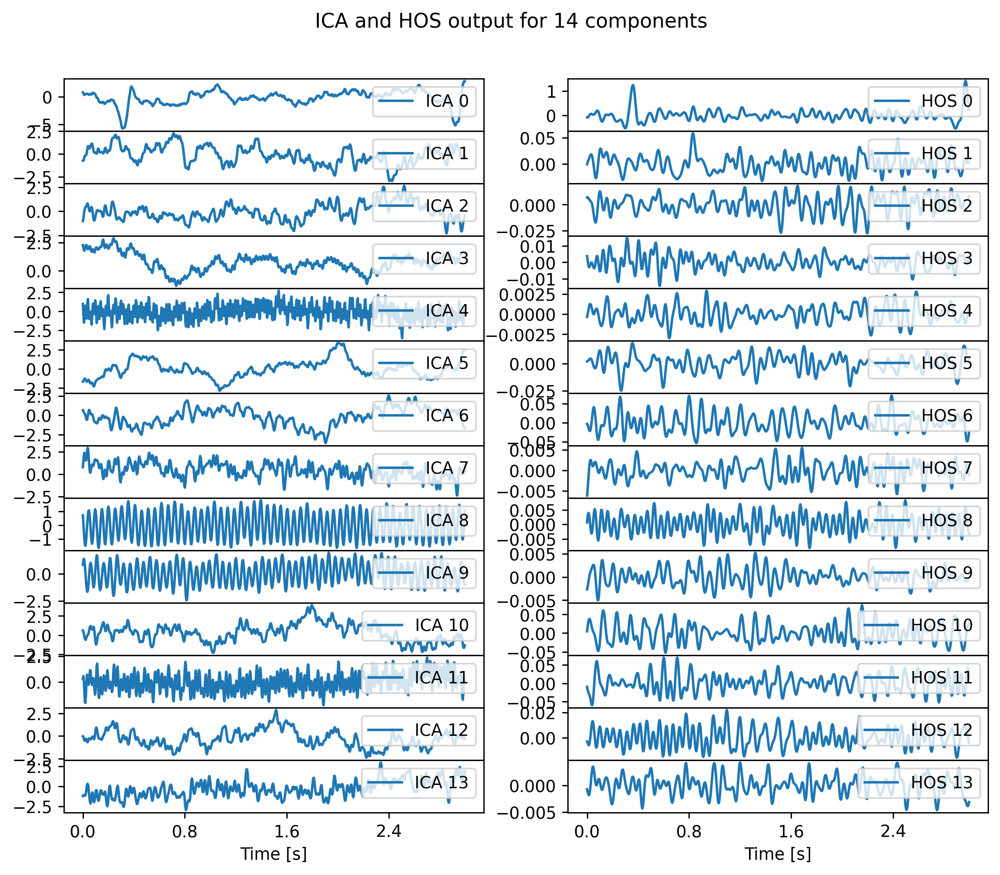

In [35]:
import matplotlib.ticker as mtick

# Set a fixed figure size that works well for the range of ICA channels you're interested in
fig_size = (10, 8)

for no_ica_chans in range(2, len(useful_indices)):
    components = functions.FASTICA(data_filtered[5000:, useful_indices], no_ica_chans)

    # Create a new figure for each ICA output
    fig, ax = plt.subplots(no_ica_chans, 2, sharex=True, figsize=fig_size, dpi=250)
    fig.subplots_adjust(hspace=0)

    for j in range(no_ica_chans):
        ax[j, 0].plot(components[offset:(offset + 3*fs), j], label=f'ICA {j}')
        ax[j, 0].legend(loc=1)

    # Format the x-axis for the ICA subplots
    for ax_ in ax[-1, :]:
        ax_.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: "{:.1f}".format(x/fs)))
        ax_.set_xlabel('Time [s]')

    fig.suptitle(f"ICA and HOS output for {no_ica_chans} components", y=0.95, horizontalalignment='center')

    component_hos = np.zeros_like(components)
    for channel in range(components.shape[1]):
        beat, detect = apply_hosd(components[:, channel], window_size)
        component_hos[:, channel] = detect

    for j in range(no_ica_chans):
        ax[j, 1].plot(component_hos[offset:(offset + 3*fs), j], label=f'HOS {j}')
        ax[j, 1].legend(loc=1)

    # Format the x-axis for the HOS subplots
    for ax_ in ax[-1, :]:
        ax_.xaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: "{:.1f}".format(x/fs)))
        ax_.set_xlabel('Time [s]')

    plt.show()